<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Module" data-toc-modified-id="Module-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Module</a></span></li><li><span><a href="#Predictions-from-nearby-only" data-toc-modified-id="Predictions-from-nearby-only-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Predictions from nearby only</a></span><ul class="toc-item"><li><span><a href="#convenience-functions" data-toc-modified-id="convenience-functions-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>convenience functions</a></span></li><li><span><a href="#Fixed-variances" data-toc-modified-id="Fixed-variances-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Fixed variances</a></span></li><li><span><a href="#Sum-of-products,-freed-variances" data-toc-modified-id="Sum-of-products,-freed-variances-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Sum of products, freed variances</a></span></li><li><span><a href="#Sum-of-products,-all-parameters-free" data-toc-modified-id="Sum-of-products,-all-parameters-free-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Sum of products, all parameters free</a></span></li><li><span><a href="#Simpler" data-toc-modified-id="Simpler-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Simpler</a></span></li></ul></li><li><span><a href="#STAN-Imputations" data-toc-modified-id="STAN-Imputations-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>STAN Imputations</a></span></li><li><span><a href="#2x2-plot-of-imputations" data-toc-modified-id="2x2-plot-of-imputations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>2x2 plot of imputations</a></span></li><li><span><a href="#Aggregating--imputation-MSE-over-all-windows" data-toc-modified-id="Aggregating--imputation-MSE-over-all-windows-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Aggregating  imputation MSE over all windows</a></span></li><li><span><a href="#Aggregating-nearby-pred-diagnostics" data-toc-modified-id="Aggregating-nearby-pred-diagnostics-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Aggregating nearby-pred diagnostics</a></span></li></ul></div>

In [1]:
const SAVED_DIR = "/Volumes/Samsung250GB/temperature_model/saved"

"/Volumes/Samsung250GB/temperature_model/saved"

In [2]:
data_dir="../"

"../"

In [3]:
using DataFrames
using Base.Dates

In [4]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=false)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;

In [5]:
iowa_time(ts) = ts - Hour(6)

iowa_time (generic function with 1 method)

In [6]:
include("../src/TempModel.jl")

TempModel

In [7]:
# obtain the list of stations
isdList=TempModel.read_isdList(;data_dir=data_dir)
# just the Iowa stations
isdSubset=isdList[[(usaf in (725450,725460,725480,725485)) for usaf in isdList[:USAF]],:]

# obtain the hourly temperature measurements for those stations
hourly_cat=TempModel.read_Stations(isdSubset; data_dir=data_dir)
# mark station 3 (Waterloo) as the test station
itest=3
# separate temperatures into train and test
hourly_train = hourly_cat[hourly_cat[:station].!=itest,:]
hourly_test  = hourly_cat[hourly_cat[:station].==itest,:]
# get the USAF code for the test station
test_usaf=isdSubset[itest,:USAF]

# emulate daily Tx/Tn measurement
hr_measure = Hour(17) # number between 0 and 24
hourly_test[:ts_day] = [TempModel.measurement_date(t, hr_measure) for t in hourly_test[:ts]]
TnTx = DataFrames.by(hourly_test, :ts_day, df -> DataFrame(
    Tn=minimum(df[:temp]), 
    Tx=maximum(df[:temp])))
# add column to test data for TnTx (useful for plotting)
test_trimmed=join(hourly_test, TnTx, on=:ts_day)
head(test_trimmed)

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] #readtable#233(::Bool, ::Char, ::Array{Char,1}, ::Char, ::Array{String,1}, ::Array{String,1}, ::Array{String,1}, ::Bool, ::Int64, ::Array{Symbol,1}, ::Array{Any,1}, ::Bool, ::Char, ::Bool, ::Int64, ::Array{Int64,1}, ::Bool, ::Symbol, ::Bool, ::Bool, ::DataFrames.#readtable, ::String) at /Users/imolk/Library/Julia/packages_experimental/v0.6/DataFrames/src/deprecated.jl:1050
 [3] readtable(::String) at /Users/imolk/Library/Julia/packages_experimental/v0.6/DataFrames/src/deprecated.jl:1050
 [4] #read_isdList#18(::String, ::Function) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/preprocessing.jl:31
 [5] (::TempModel.#kw##read_isdList)(::Array{Any,1}, ::TempModel.#read_isdList) at ./<missing>:0
 [6] include_string(::String, ::String) at /Users/imolk/bin/julia_v0.6.2_binary/lib/julia/sys.dylib:?
 [7] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages_experimental/v0.6/Com

,year,month,day,hour,min,seconds,temp,ts,station,ts_hours,ts_day,Tn,Tx
1,2015,1,1,0,0,0,-8.3,2015-01-01T00:00:00,3,0.0,2015-01-01,-11.1,-3.9
2,2015,1,1,0,54,0,-8.9,2015-01-01T00:54:00,3,0.9,2015-01-01,-11.1,-3.9
3,2015,1,1,1,54,0,-8.9,2015-01-01T01:54:00,3,1.9,2015-01-01,-11.1,-3.9
4,2015,1,1,2,54,0,-9.4,2015-01-01T02:54:00,3,2.9,2015-01-01,-11.1,-3.9
5,2015,1,1,3,54,0,-9.4,2015-01-01T03:54:00,3,3.9,2015-01-01,-11.1,-3.9
6,2015,1,1,4,54,0,-10.0,2015-01-01T04:54:00,3,4.9,2015-01-01,-11.1,-3.9


# Module

In [51]:
module Batch
    const SAVED_DIR = "/Volumes/Samsung250GB/temperature_model/saved"
    using ..TempModel
    import PyPlot; plt=PyPlot
    using LaTeXStrings
    using DataFrames
    using Base.Dates
    using Distributions
    plt.rc("figure", dpi=300.0)
    plt.rc("figure", figsize=(12,8))
    plt.rc("savefig", dpi=300.0)
    plt.rc("text", usetex=false)
    plt.rc("font", family="serif")
    plt.rc("font", serif="Palatino")
    ;
    include("../src/batch_diagnostics.jl")
    include("../src/plot_diagnostics.jl")
end

Batch

# Predictions from nearby only

## convenience functions

In [9]:
function plot_pred(GPmodel, xlim)
    nearby_pred = Batch.get_nearby(test_fw, GPmodel, test_usaf)
    test_data = test_trimmed
    train_data = hourly_train
    stations_metadata = isdSubset
    Batch.plot_predictive(
            nearby_pred, 
            test_data, train_data, stations_metadata, 
            iowa_time, 
            xlim; # xlim
            imputations=1)
end

plot_pred (generic function with 1 method)

In [10]:
function print_diag(GPmodel)
    nearby_pred = Batch.get_nearby(test_fw, GPmodel, test_usaf)
    test_data = test_trimmed
    train_data = hourly_train
    Batch.print_diagnostics(nearby_pred, test_data, train_data; ndraws=1000)
end

print_diag (generic function with 1 method)

## Fixed variances

In [11]:
test_fw = Batch.FittingWindow(Date(2015,4,8),Date(2015,6,20))

Batch.FittingWindow(2015-04-08, 2015-06-20)

In [12]:
GPmodel="fixed_var"

"fixed_var"

In [13]:
nearby_pred = Batch.get_nearby(test_fw, GPmodel, test_usaf);

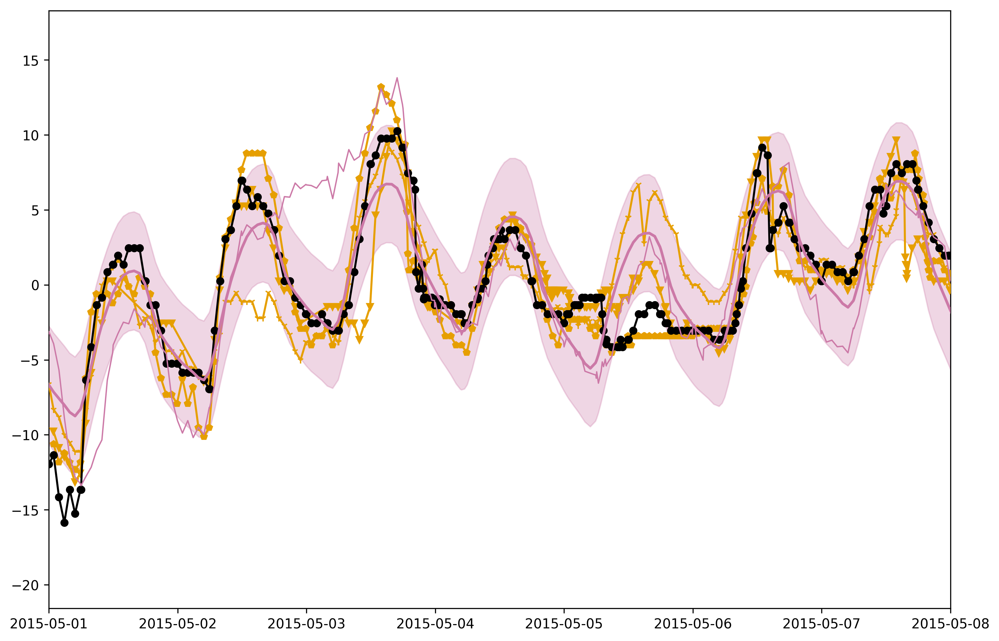

In [14]:
plot_pred("fixed_var", (DateTime(2015,5,1,6,0,0), DateTime(2015,5,8,6,0,0)))
;

In [15]:
print_diag("fixed_var")

var(predicted mean - simulated prediction)= 10.570
var(predicted mean - simulated prediction)= 9.070
var(predicted mean - simulated prediction)= 9.281
var(predicted mean - simulated prediction)= 10.300
var(predicted mean - simulated prediction)= 9.006
E(var(predicted mean - predictive draw))= 9.334
var(truth - predicted mean)= 6.091


var(truth - predicted mean)=6

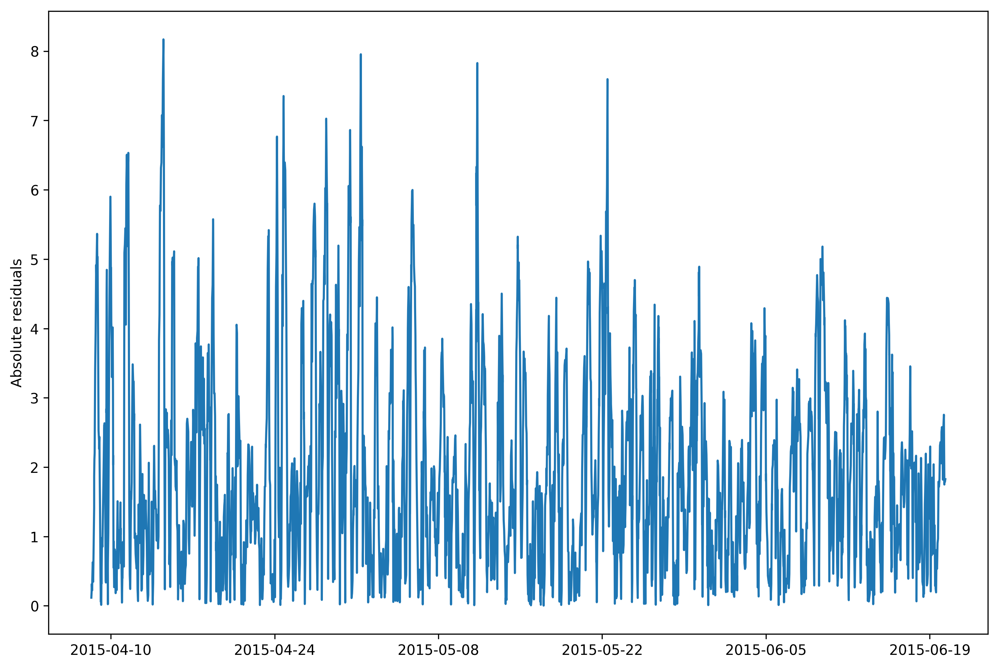

.090607796619108


PyObject <matplotlib.text.Text object at 0x13064cf98>

In [16]:
Batch.plot_residuals(nearby_pred, test_trimmed)

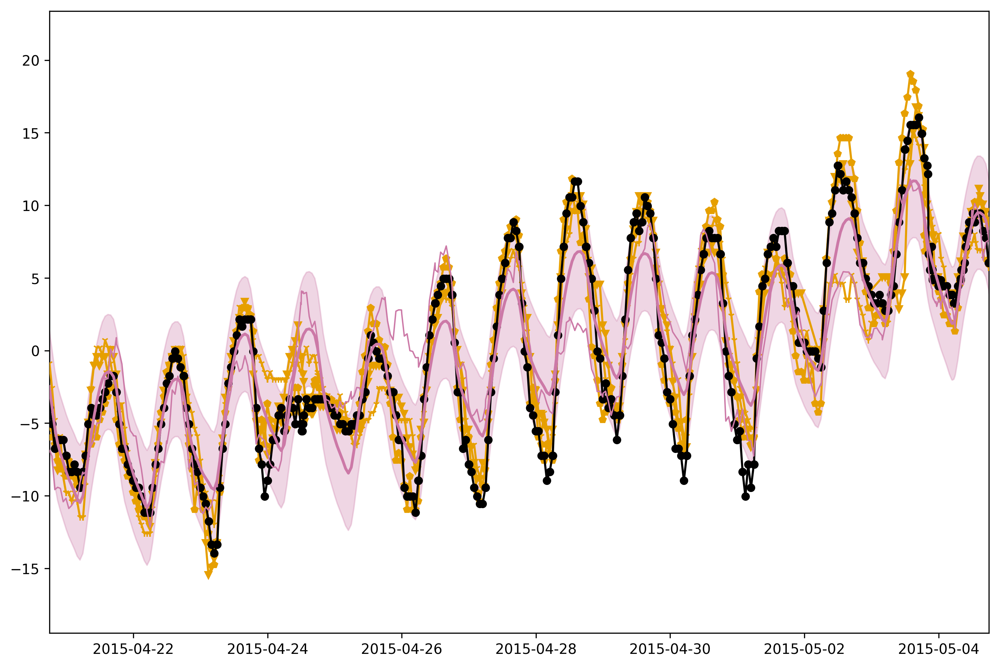

In [17]:
plot_pred("fixed_var", (DateTime(2015,4,21),DateTime(2015,5,5)))
;

## Sum of products, freed variances

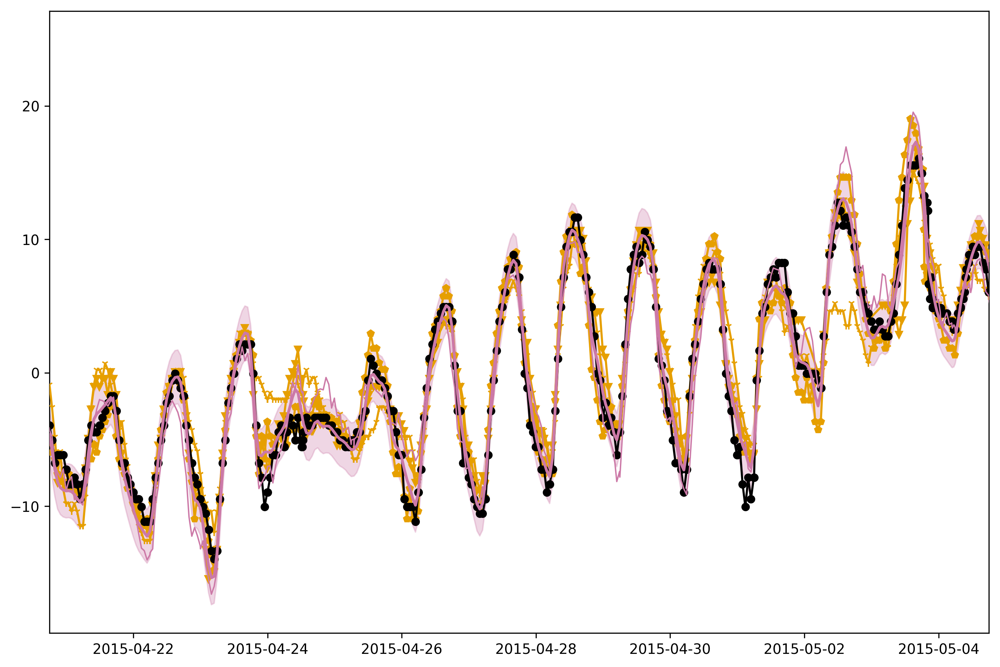

(735708.75, 735722.75)

In [18]:
plot_pred("free_var", (DateTime(2015,4,21),DateTime(2015,5,5)))

In [19]:
@time print_diag("free_var")

var(predicted mean - simulated prediction)= 2.142
var(predicted mean - simulated prediction)= 2.388
var(predicted mean - simulated prediction)= 2.400
var(predicted mean - simulated prediction)= 1.837
var(predicted mean - simulated prediction)= 2.275
E(var(predicted mean - predictive draw))= 2.436
var(truth - predicted mean)= 1.249
  2.855169 seconds (19.36 k allocations: 399.255 MiB, 11.99% gc time)


## Sum of products, all parameters free

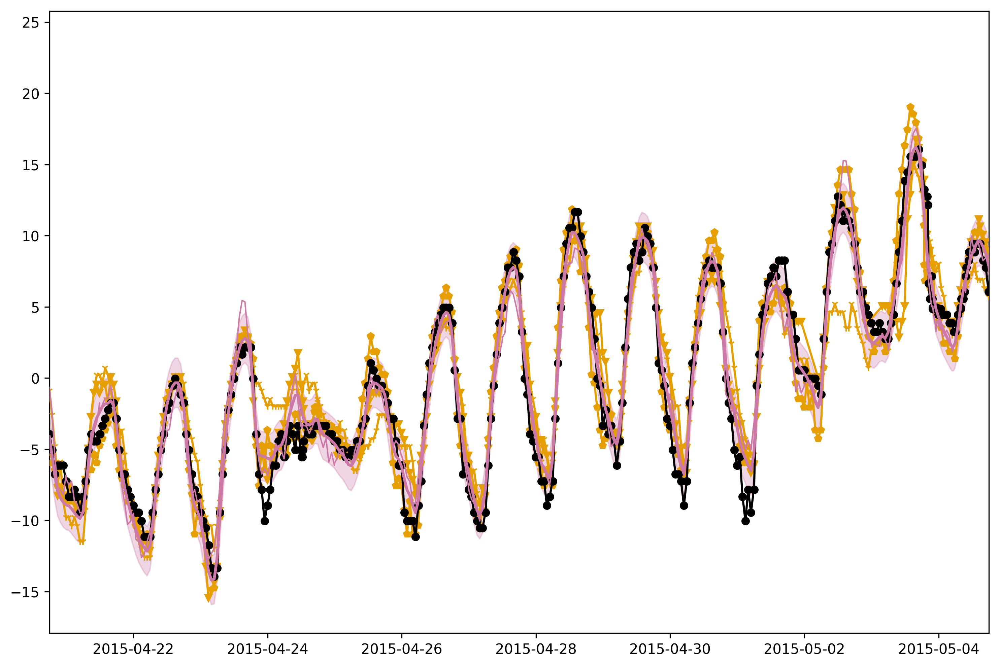

(735708.75, 735722.75)

In [20]:
plot_pred("sumprod", (DateTime(2015,4,21),DateTime(2015,5,5)))

In [21]:
print_diag("sumprod")

var(predicted mean - simulated prediction)= 1.684
var(predicted mean - simulated prediction)= 1.679
var(predicted mean - simulated prediction)= 1.770
var(predicted mean - simulated prediction)= 2.020
var(predicted mean - simulated prediction)= 2.089
E(var(predicted mean - predictive draw))= 1.817
var(truth - predicted mean)= 1.377


Annoyingly, we again see that even though this model has more free parameters, and the marginal likelihood was significantly lower (when we optimized all the parameters), the predictive variance is actually worse (higher).

## Simpler

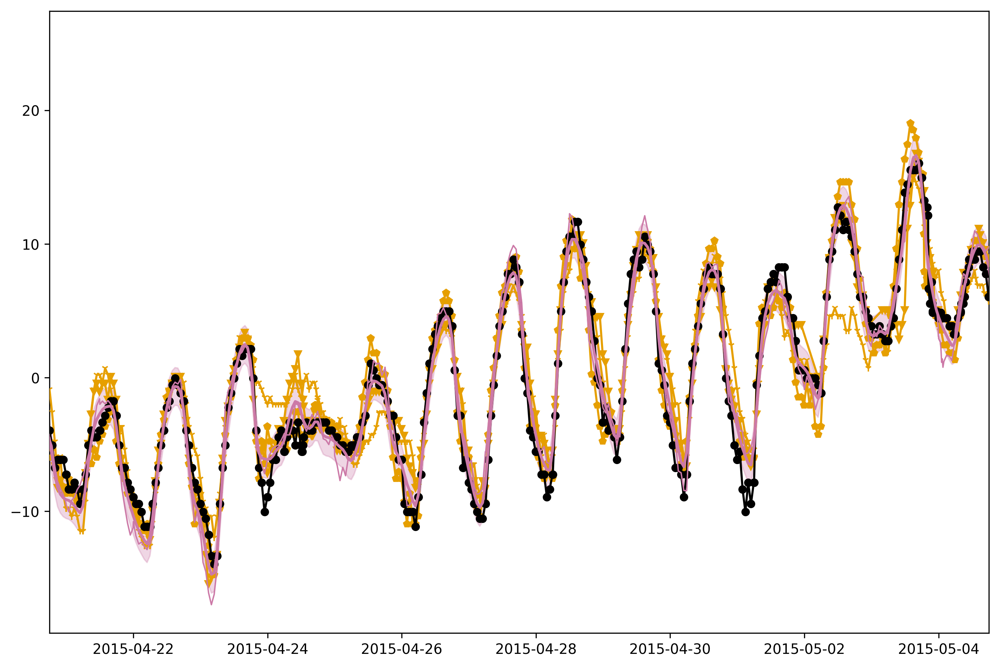

(735708.75, 735722.75)

In [22]:
plot_pred("simpler", (DateTime(2015,4,21),DateTime(2015,5,5)))

In [23]:
print_diag("simpler")

var(predicted mean - simulated prediction)= 1.178
var(predicted mean - simulated prediction)= 1.151
var(predicted mean - simulated prediction)= 1.167
var(predicted mean - simulated prediction)= 1.078
var(predicted mean - simulated prediction)= 1.203
E(var(predicted mean - predictive draw))= 1.208
var(truth - predicted mean)= 1.277


# STAN Imputations

In [24]:
function plot_imput(GPmodel)
    window_num = 40
    stan_fw = Batch.get_window(window_num)
    hr_measure = Hour(17)
    chains, _ts = Batch.get_chains_and_ts(stan_fw, GPmodel, test_usaf)
    temp_impute = Batch.get_temperatures_reparam(chains)
    test_subsubset = Batch.get_test_fw(test_trimmed, stan_fw, hr_measure)

    Batch.plot_truth(test_subsubset, stan_fw, hr_measure, iowa_time; tntx=true)
    Batch.plot_imputations(test_subsubset[:ts], temp_impute, iowa_time)
    plt.plot(iowa_time.(_ts), temp_impute[500,:,1],
        color="#009F77")

    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", isdSubset[itest,:NAME]))
    plt.xlim(Date(2015,5,2), Date(2015,5,5))
end

plot_imput (generic function with 1 method)

In [25]:
function imput_diag(GPmodel)
    window_num = 40
    stan_fw = Batch.get_window(window_num)
    hr_measure = Hour(17)
    chains, _ts = Batch.get_chains_and_ts(stan_fw, GPmodel, test_usaf)
    diagn = Batch.ImputationDiagnostic(0.0, 0.0, 0)
    temp_impute = Batch.get_temperatures_reparam(chains)
    test_subsubset = Batch.get_test_fw(test_trimmed, stan_fw, hr_measure)
    diagn += Batch.ImputationDiagnostic(temp_impute, test_subsubset)
    @printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(diagn))
    @printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(diagn))
end

imput_diag (generic function with 1 method)

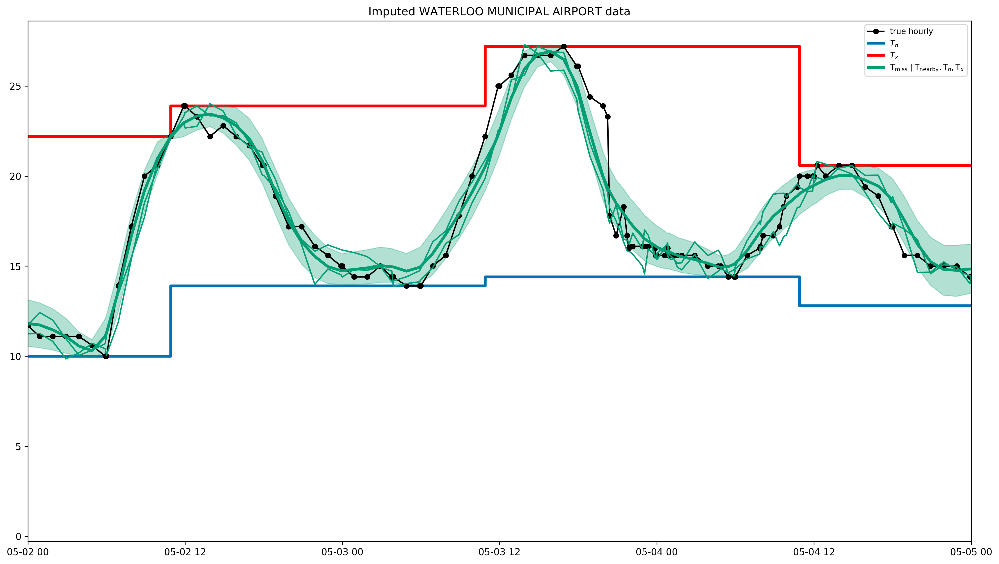

In [26]:
plot_imput("simpler")

plt.savefig("../figures/imputations_simpler.png", bbox_inches="tight")
plt.savefig("../figures/imputations_simpler.pdf", bbox_inches="tight")
;

In [27]:
imput_diag("simpler")

E(var(predicted mean - predictive draw))=0.82730
MSE(truth - predicted mean)=             1.24456


# 2x2 plot of imputations

In [29]:
plot_nearby = function(GPmodel, xlim1, xlim2)
    nearby_pred = Batch.get_nearby(test_fw, GPmodel, test_usaf)
    test_data = test_trimmed
    train_data = hourly_train
    stations_metadata = isdSubset
    Batch.plot_predictive(
            nearby_pred, 
            test_data, train_data, stations_metadata, 
            iowa_time, 
            (xlim1, xlim2); # xlim
            truth=true,
            imputations=1,
            neighbours=true,
            mean_impt=true,
            markersize=4)
            
    plt.xticks((iowa_time(xlim1)+Day(1)):Day(1):iowa_time(xlim2))
    plt.gcf()[:autofmt_xdate]()
end

plot_stan = function(GPmodel, window_num, xlim1, xlim2)
    stan_fw = Batch.get_window(window_num)
    println("STAN window: ", stan_fw)
    hr_measure = Hour(17)
    chains, _ts = Batch.get_chains_and_ts(stan_fw, GPmodel, test_usaf)
    temp_impute = Batch.get_temperatures_reparam(chains)
    test_subsubset = Batch.get_test_fw(test_trimmed, stan_fw, hr_measure)

    Batch.plot_truth(test_subsubset, stan_fw, hr_measure, iowa_time; tntx=true, markersize=4)
    Batch.plot_imputations(test_subsubset[:ts], temp_impute, iowa_time; impt_indices=[250,500])

    plt.xticks((iowa_time(xlim1)+Day(1)):Day(1):iowa_time(xlim2))
    plt.gca()[:xaxis][:set_major_formatter](plt.matplotlib[:dates][:DateFormatter]("%Y-%m-%d"))
    plt.xlim(iowa_time(xlim1), iowa_time(xlim2))
    plt.gcf()[:autofmt_xdate]()
    plt.ylim(9,28)
end

function yaxis_right()
    ax = plt.gca()
    ax[:yaxis][:tick_right]()
    ax[:yaxis][:set_label_position]("right")
end
function title_in_axis(s)
    plt.text(0.05, 0.95,s,
         horizontalalignment="left",
         verticalalignment="top",
         transform = plt.gca()[:transAxes])
end

title_in_axis (generic function with 1 method)

STAN window: Batch.FittingWindow(2015-04-28, 2015-05-07)


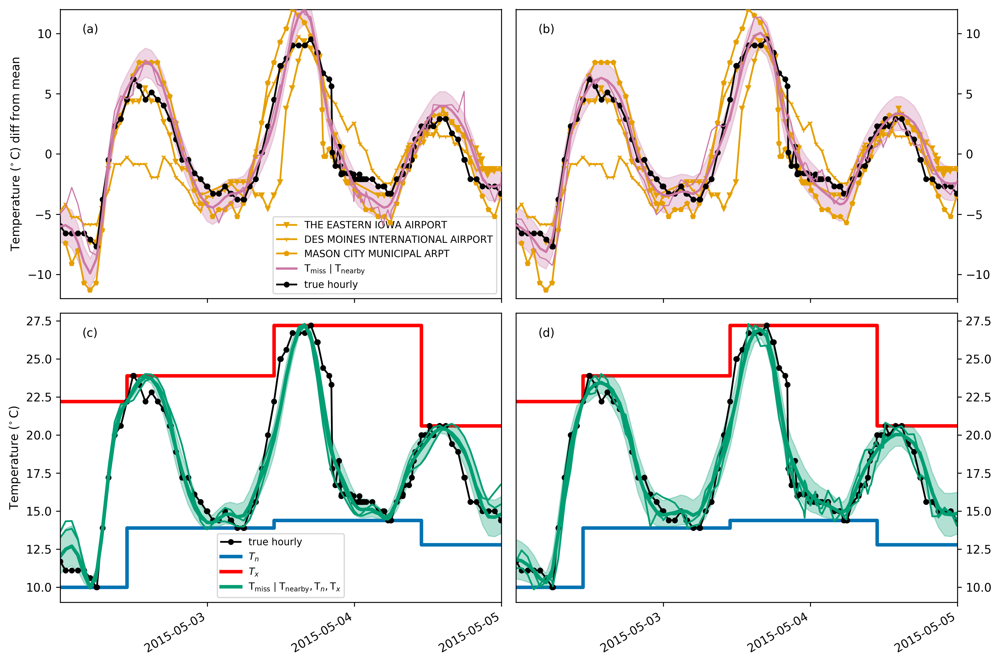

STAN window: Batch.FittingWindow(2015-04-28, 2015-05-07)


In [40]:
xlim1 = DateTime(2015,5,2,6,0,0)
xlim2 = DateTime(2015,5,5,6,0,0)
window_num = 40

plt.subplot(2,2,1)
plot_nearby("SExSE", xlim1, xlim2)
plt.ylim(-12, 12)
plt.legend(loc="best", fontsize="small")
plt.ylabel(L"Temperature $({}^{\circ}\,\mathrm{C})$ diff from mean")
title_in_axis("(a)")


plt.subplot(2,2,2)
plot_nearby("simpler", xlim1, xlim2)
title_in_axis("(b)")
plt.ylim(-12, 12)
yaxis_right()


plt.subplot(2,2,3)
plot_stan("SExSE", window_num, xlim1, xlim2)
title_in_axis("(c)")
plt.ylabel(L"Temperature $({}^{\circ}\,\mathrm{C})$")
plt.legend(loc="best", fontsize="small")
# plt.ylim(9,28)

plt.subplot(2,2,4)
plot_stan("simpler", window_num, xlim1, xlim2)
title_in_axis("(d)")
yaxis_right()
# plt.ylim(9,28)

plt.gcf()[:tight_layout]()

In [31]:
Batch.get_window(49)

Batch.FittingWindow(2015-05-25, 2015-06-03)

STAN window: Batch.FittingWindow(2015-05-25, 2015-06-03)


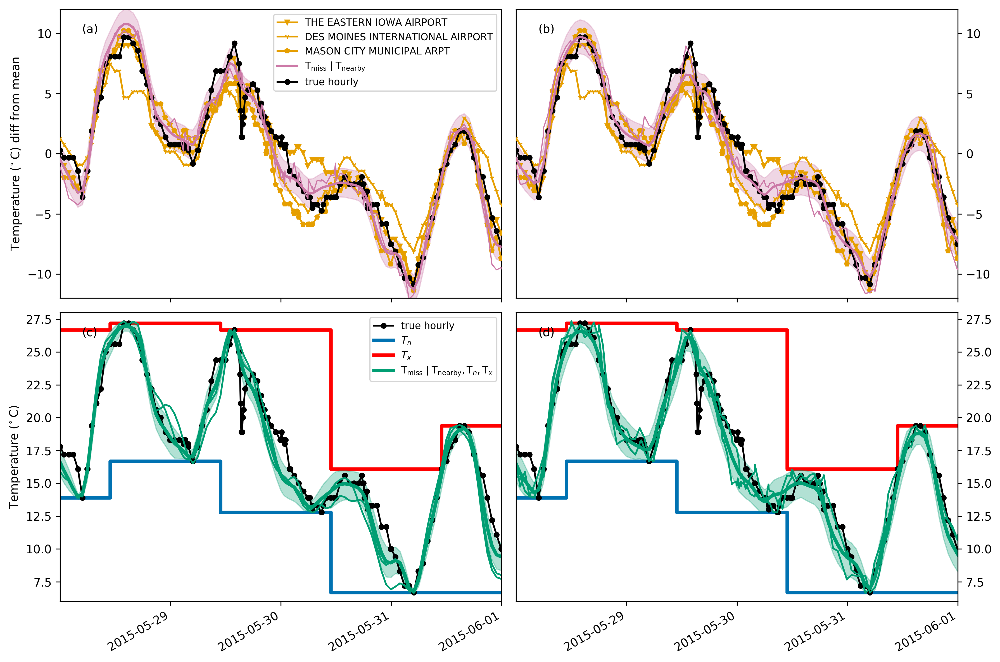

STAN window: Batch.FittingWindow(2015-05-25, 2015-06-03)


In [41]:
xlim1 = DateTime(2015,5,28,6,0,0)
xlim2 = DateTime(2015,6,1,6,0,0)
window_num = 49

plt.subplot(2,2,1)
plot_nearby("SExSE", xlim1, xlim2)
plt.ylim(-12, 12)
plt.legend(loc="best", fontsize="small")
plt.ylabel(L"Temperature $({}^{\circ}\,\mathrm{C})$ diff from mean")
title_in_axis("(a)")


plt.subplot(2,2,2)
plot_nearby("simpler", xlim1, xlim2)
title_in_axis("(b)")
plt.ylim(-12, 12)
yaxis_right()


plt.subplot(2,2,3)
plot_stan("SExSE", window_num, xlim1, xlim2)
title_in_axis("(c)")
plt.ylabel(L"Temperature $({}^{\circ}\,\mathrm{C})$")
plt.legend(loc="best", fontsize="small")
plt.ylim(6,28)

plt.subplot(2,2,4)
plot_stan("simpler", window_num, xlim1, xlim2)
title_in_axis("(d)")
yaxis_right()
plt.ylim(6,28)

plt.gcf()[:tight_layout]()

plt.savefig("../figures/imputations_2x2.png", bbox_inches="tight")
plt.savefig("../figures/imputations_2x2.pdf", bbox_inches="tight")

# Aggregating  imputation MSE over all windows

In [62]:
all_impt_diagn = Dict{String, Vector{Batch.ImputationDiagnostic}}()

Dict{String,Array{Batch.ImputationDiagnostic,1}} with 0 entries

In [63]:
function all_imput_mse(GPmodel)
    diagn_vec = Batch.ImputationDiagnostic[]
    hr_measure = Hour(17)
    for window_num in 1:150
        print(window_num,", ")
        # get the start and end datetime for this stan window
        stan_fw = Batch.get_window(window_num)
        # get the central 3 days of the window
        center_fw = Batch.window_center(stan_fw, Batch.stan_increment)
        # load the MCMC output from disk
        local chains
        local ts
        try
            chains, ts = Batch.get_chains_and_ts(stan_fw, GPmodel, test_usaf)
        catch
            break
        end
        # extract temepratures from MCMC
        temp_impute = Batch.get_temperatures_reparam(chains)
        # subset of test dataframe coinciding with the STAN window
        test_stan_fw = Batch.get_test_fw(test_trimmed, stan_fw, hr_measure)
        # subset of test dataframe coinciding with the center of the  STAN window
        arg_center_fw = Batch.arg_test_fw(test_stan_fw, center_fw, hr_measure)
        test_center_fw = Batch.get_test_fw(test_stan_fw, center_fw, hr_measure)
        # extract MCMC imputed temperatures for center of the STAN window
        temp_impute_center = temp_impute[:,arg_center_fw,:]
        # generate diagnostic
        diagn = Batch.ImputationDiagnostic(temp_impute_center, test_center_fw)
        push!(diagn_vec, diagn)
    end
    return diagn_vec
end

all_imput_mse (generic function with 1 method)

In [65]:
GPmodel = "SExSE"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.44239
MSE(truth - predicted mean)=             1.11551


In [66]:
GPmodel = "simpler"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
print("\n")
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, E(var(predicted mean - predictive draw))=0.81225
MSE(truth - predicted mean)=             1.03690


In [67]:
GPmodel = "diurnal"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
print("\n")
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, E(var(predicted mean - predictive draw))=0.69755
MSE(truth - predicted mean)=             2.50655


In [68]:
GPmodel = "fixed_var"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
print("\n")
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

1, 

LoadError: [91mMethodError: no method matching zero(::Type{Batch.ImputationDiagnostic})[0m
Closest candidates are:
  zero([91m::Type{Base.LibGit2.GitHash}[39m) at libgit2/oid.jl:106
  zero([91m::Type{Base.Pkg.Resolve.VersionWeights.VWPreBuildItem}[39m) at pkg/resolve/versionweight.jl:82
  zero([91m::Type{Base.Pkg.Resolve.VersionWeights.VWPreBuild}[39m) at pkg/resolve/versionweight.jl:124
  ...[39m

In [69]:
GPmodel = "free_var"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
print("\n")
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, E(var(predicted mean - predictive draw))=0.89740
MSE(truth - predicted mean)=             2.49342


In [70]:
GPmodel = "sumprod"
all_impt_diagn[GPmodel] = all_imput_mse(GPmodel)
print("\n")
@printf("E(var(predicted mean - predictive draw))=%.5f\n", Batch.EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", Batch.mse(sum(all_impt_diagn[GPmodel])))

1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, E(var(predicted mean - predictive draw))=0.95070
MSE(truth - predicted mean)=             2.44979


In [73]:
delete!(all_impt_diagn, "fixed_var")

Dict{String,Array{Batch.ImputationDiagnostic,1}} with 5 entries:
  "free_var" => Batch.ImputationDiagnostic[Batch.ImputationDiagnostic(134.434, …
  "sumprod"  => Batch.ImputationDiagnostic[Batch.ImputationDiagnostic(141.001, …
  "SExSE"    => Batch.ImputationDiagnostic[Batch.ImputationDiagnostic(63.1547, …
  "simpler"  => Batch.ImputationDiagnostic[Batch.ImputationDiagnostic(118.661, …
  "diurnal"  => Batch.ImputationDiagnostic[Batch.ImputationDiagnostic(97.3322, …

In [74]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    @printf("model: %s\n", GPmodel)
    @printf("E(var(predicted mean - predictive draw))=%.3f\n", Batch.EVarError(sum(diagns)))
    @printf("MSE(truth - predicted mean)=             %.3f\n", Batch.mse(sum(diagns)))
    print("=============================\n")
end

model: free_var
E(var(predicted mean - predictive draw))=0.897
MSE(truth - predicted mean)=             2.493
model: sumprod
E(var(predicted mean - predictive draw))=0.951
MSE(truth - predicted mean)=             2.450
model: SExSE
E(var(predicted mean - predictive draw))=0.442
MSE(truth - predicted mean)=             1.116
model: simpler
E(var(predicted mean - predictive draw))=0.812
MSE(truth - predicted mean)=             1.037
model: diurnal
E(var(predicted mean - predictive draw))=0.698
MSE(truth - predicted mean)=             2.507


Previously:

```
model: free_var
E(var(predicted mean - predictive draw))=0.897
MSE(truth - predicted mean)=             1.150
=============================
model: sumprod
E(var(predicted mean - predictive draw))=0.950
MSE(truth - predicted mean)=             1.152
=============================
model: SExSE
E(var(predicted mean - predictive draw))=0.614
MSE(truth - predicted mean)=             1.104
=============================
model: simpler
E(var(predicted mean - predictive draw))=0.823
MSE(truth - predicted mean)=             1.069
=============================
model: diurnal
E(var(predicted mean - predictive draw))=0.697
MSE(truth - predicted mean)=             1.137
=============================
```

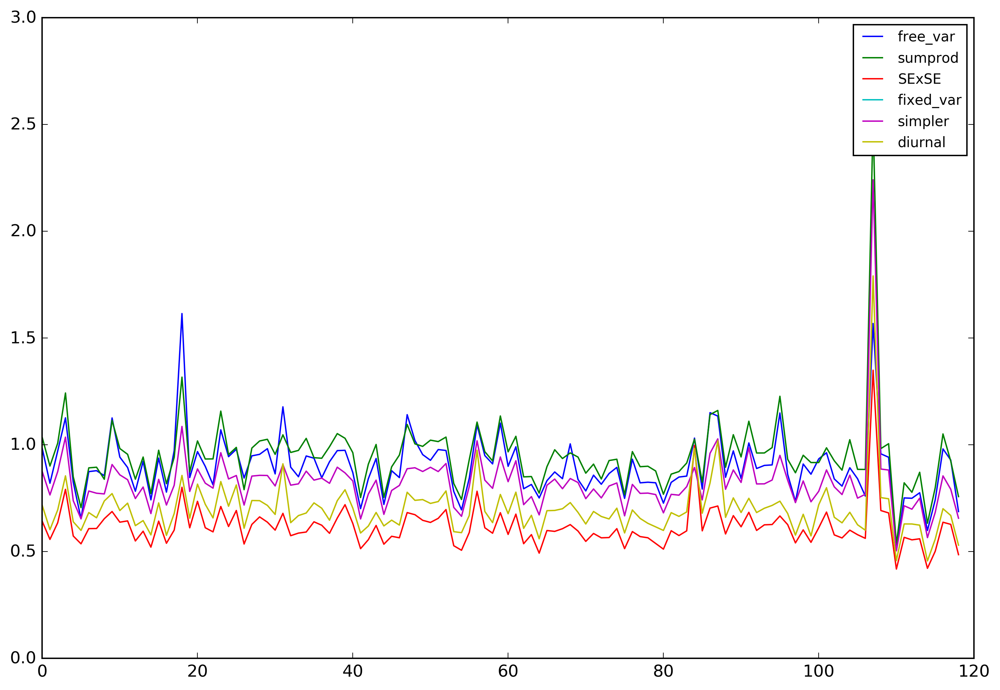

PyObject <matplotlib.legend.Legend object at 0x322ba2350>

In [48]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    plt.plot([EVarError(d) for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

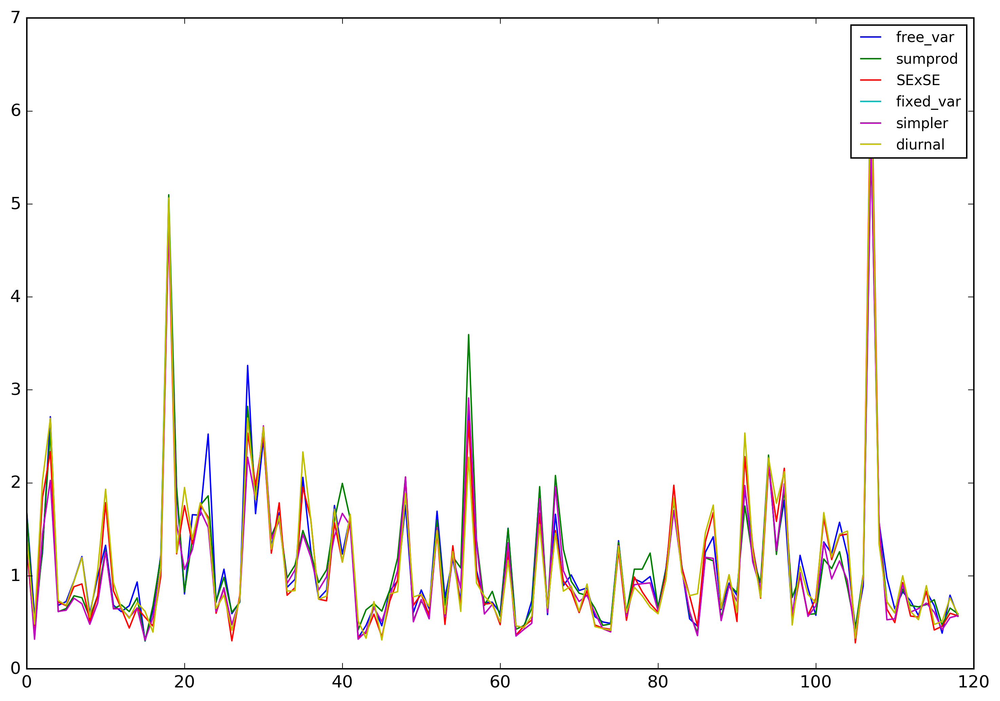

PyObject <matplotlib.legend.Legend object at 0x30f55a690>

In [74]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    plt.plot([mse(d) for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

In [49]:
GPmodel = "sumprod"
window_num = 6
stan_fw = get_window(window_num)
chains = get_chains(stan_fw, GPmodel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts], temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", isdSubset[itest,:NAME]))
;

LoadError: UndefVarError: get_chains not defined

# Aggregating nearby-pred diagnostics

In [89]:
type NearbyPredDiagnostic
    sumEVarError::Float64
    sumVarError::Float64
    n::Int
end

In [90]:
function +(diag1::NearbyPredDiagnostic,diag2::NearbyPredDiagnostic)
    return NearbyPredDiagnostic(
        diag1.sumEVarError + diag2.sumEVarError,
        diag1.sumVarError + diag2.sumVarError,
        diag1.n + diag2.n
        )
end

+ (generic function with 306 methods)

In [91]:
test_windows = [
    FittingWindow(Date(2015,1,1),Date(2015,3,14)),
    FittingWindow(Date(2015,1,25),Date(2015,4,8)),
    FittingWindow(Date(2015,2,18),Date(2015,5,2)),
    FittingWindow(Date(2015,3,14),Date(2015,5,26)),
    FittingWindow(Date(2015,4,8),Date(2015,6,20)),
    FittingWindow(Date(2015,5,2),Date(2015,7,14)),
    FittingWindow(Date(2015,5,26),Date(2015,8,7)),
    FittingWindow(Date(2015,6,20),Date(2015,9,1)),
    FittingWindow(Date(2015,7,14),Date(2015,9,25)),
    FittingWindow(Date(2015,8,7),Date(2015,10,19)),
    FittingWindow(Date(2015,9,1),Date(2015,11,13)),
    FittingWindow(Date(2015,9,25),Date(2015,12,7)),
    FittingWindow(Date(2015,10,19),Date(2015,12,31)),
]

13-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-25, 2015-04-08)
 FittingWindow(2015-02-18, 2015-05-02)
 FittingWindow(2015-03-14, 2015-05-26)
 FittingWindow(2015-04-08, 2015-06-20)
 FittingWindow(2015-05-02, 2015-07-14)
 FittingWindow(2015-05-26, 2015-08-07)
 FittingWindow(2015-06-20, 2015-09-01)
 FittingWindow(2015-07-14, 2015-09-25)
 FittingWindow(2015-08-07, 2015-10-19)
 FittingWindow(2015-09-01, 2015-11-13)
 FittingWindow(2015-09-25, 2015-12-07)
 FittingWindow(2015-10-19, 2015-12-31)

In [92]:
test_windows[3].end_date

2015-05-02

In [93]:
DateTime(2015,5,2,0,0,0) <= Date(2015,5,2)

true

In [94]:
""" 
    Is window A inside of window B?
"""
function a_isinside_b(t::DateTime, b::FittingWindow)
    start_after = t >= b.start_date
    end_before = t <= b.end_date+Day(1)
    return start_after & end_before
end
"""
    How much buffer time is there on either side of the window?
"""
function buffer(t::DateTime, b::FittingWindow)
    start_diff = abs(t - b.start_date)
    end_diff = abs(t - (b.end_date+Day(1)))
    return min(start_diff, end_diff)
end
""" 
    Amongst a list of candidate windows `cand`, find the window that includes `wind`
    with the largest buffer on either sides.
"""
function find_best_window(t::DateTime, cands::Vector{FittingWindow})
    incl_wdows = [fw for fw in cands if a_isinside_b(t, fw)]
    buffers = [buffer(t, fw) for fw in incl_wdows]
    imax = indmax(buffers)
    best_window = incl_wdows[imax]
    return best_window
end

find_best_window

In [95]:
test_ts = hourly_test[:ts];

In [96]:
best_pred_window = [find_best_window(t, test_windows) for t in test_ts]
;

In [97]:
best_pred_window

12695-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 FittingWindow(2015-01-01, 2015-03-14)
 ⋮                                    
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19, 2015-12-31)
 FittingWindow(2015-10-19,

In [98]:
A = randn(10,10)

10×10 Array{Float64,2}:
  1.03109   -0.583443   0.773261   …   0.54996     0.661331   0.868578 
 -1.02294   -0.376657  -0.707411      -1.41216     0.559317  -0.0218003
 -1.92639    0.321182   0.0992691      0.539599    0.64033    0.89429  
 -0.26132   -0.34072    0.297567      -2.43282    -0.914105  -1.02295  
 -1.13008   -0.472666   0.453684       0.352899   -1.52534    0.433522 
  0.275063   1.14564    0.508219   …  -0.553628   -1.98581   -0.554044 
 -0.646958  -0.198417   0.776035      -0.396758   -0.336109  -0.131244 
 -1.18748    2.09076    0.922733      -0.299969   -2.29362   -1.87011  
 -0.715329  -1.79837   -0.765631       2.16943     0.91303   -0.541566 
 -0.202958   0.304843  -0.808066       0.0970622  -0.658537  -1.27269  

In [99]:
function get_diagnostics(nearby::TempModel.NearbyPrediction, ts_start::DateTime, ts_end::DateTime; 
                            ndraws=10000)

    test_subset = subset(test_trimmed, ts_start, ts_end, closed_start=true, closed_end=true)
    
    ts = nearby.ts
    iinside = argsubset(ts, ts_start, ts_end)
    ts = ts[iinside]
    μ = nearby.μ[iinside]
    Σ = full(nearby.Σ)[iinside,iinside]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ * centering
    distr = MultivariateNormal(μ, Σ)
    temp_true = test_subset[:temp]
    n = length(ts)
    return NearbyPredDiagnostic(
        mean(var(μ .- rand(distr)) for _ in 1:ndraws)*n,
        var(μ .- temp_true)*n,
        n
    )
end

get_diagnostics (generic function with 1 method)

In [100]:
all_nearby_diagn = Dict{String, Vector{NearbyPredDiagnostic}}()

Dict{String,Array{NearbyPredDiagnostic,1}} with 0 entries

In [101]:
GPmodel="SExSE"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [63]:
GPmodel="diurnal"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [64]:
GPmodel="fixed_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [65]:
GPmodel="free_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [66]:
GPmodel="sumprod"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [102]:
GPmodel="simpler"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [103]:
collect(keys(all_nearby_diagn))

2-element Array{String,1}:
 "SExSE"  
 "simpler"

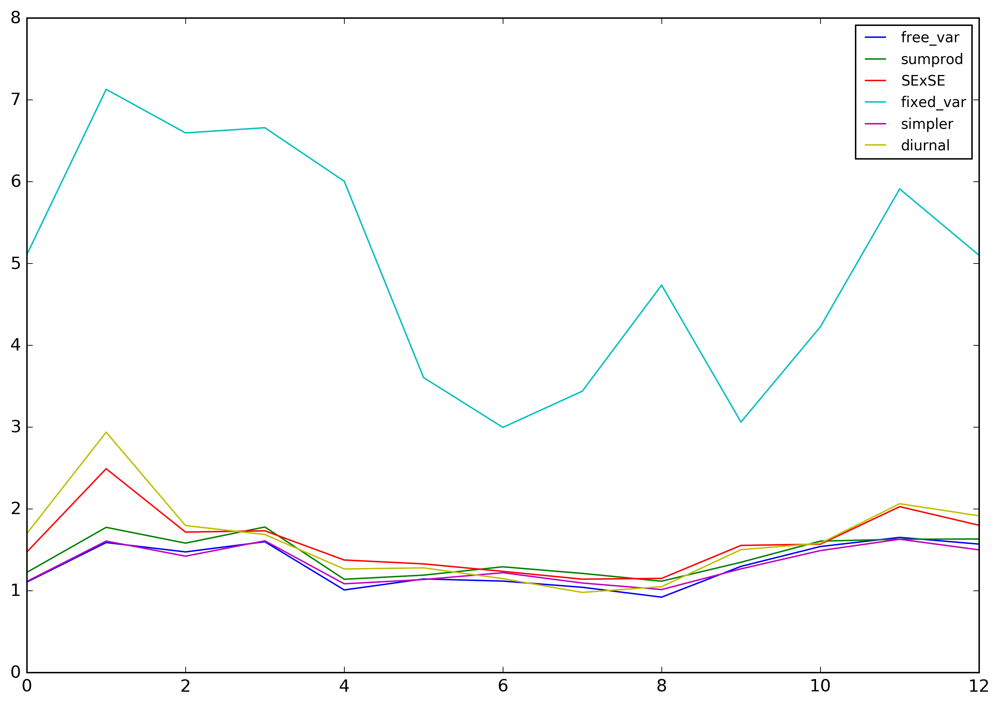

PyObject <matplotlib.legend.Legend object at 0x322c50390>

In [69]:
for GPmodel in keys(all_nearby_diagn)
    diagns = all_nearby_diagn[GPmodel]
    plt.plot([d.sumVarError/d.n for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

In [70]:
sum(all_nearby_diagn["diurnal"])

NearbyPredDiagnostic(12364.260322293852,20724.932846399304,12695)

In [71]:
@assert sum(all_nearby_diagn["diurnal"]).n == nrow(hourly_test)

In [72]:
for GPmodel in keys(all_nearby_diagn)
    @printf("model: %s\n", GPmodel)
    diagns = all_nearby_diagn[GPmodel]
    sumdiag = sum(diagns)
    @printf("Expected variance:  %.3f\n", sumdiag.sumEVarError/sumdiag.n)
    @printf("Empirical variance: %.3f\n", sumdiag.sumVarError/sumdiag.n)
    print("==========\n")
end

model: free_var
Expected variance:  2.321
Empirical variance: 1.314
model: sumprod
Expected variance:  1.765
Empirical variance: 1.423
model: SExSE
Expected variance:  0.875
Empirical variance: 1.589
model: fixed_var
Expected variance:  8.791
Empirical variance: 4.991
model: simpler
Expected variance:  1.190
Empirical variance: 1.319
model: diurnal
Expected variance:  0.974
Empirical variance: 1.633


In [104]:
for GPmodel in keys(all_nearby_diagn)
    @printf("model: %s\n", GPmodel)
    diagns = all_nearby_diagn[GPmodel]
    sumdiag = sum(diagns)
    @printf("Expected variance:  %.3f\n", sumdiag.sumEVarError/sumdiag.n)
    @printf("Empirical variance: %.3f\n", sumdiag.sumVarError/sumdiag.n)
    print("==========\n")
end

model: SExSE
Expected variance:  0.875
Empirical variance: 1.589
model: simpler
Expected variance:  1.193
Empirical variance: 1.319
